# <center> Обнаружение аномалий в данных </center>

![](https://blog.floydhub.com/content/images/2019/04/will-myers-986006-unsplash.jpg)

## <center>  Зачем искать "аномалии"? </center> 

Наиболее часто возникающие задачи:
1. Очистка данных тренировочного набора, чтобы на них не переобучится.
2. Поиск выбросов в данных, для понимания причин их вызывающих.
3. Поиск нового класса данных - как самоцель (как пример новый вид фрода - мошенических действий для получения кредитов, доступа к картам и т.д.)

В документации scikit-learn есть [определение](https://scikit-learn.org/stable/modules/outlier_detection.html), которое сводит задачу поиска анаомали к двум классам задач:  

- **Outlier detection** (поиск выбросов): тренировочный набор содержит данные, которые определяются как выбросы - данные удаленные от  остальных. Таким образом, алгоритм обнаружения выбросов пытаются найти область, где тренировочный набор наиболее сконцентрирован игнорируя выбросы.

- **Novelty detection** (поиск новизны): в тренировочном наборе отсутствуют выбросы, и модель пытается определить, является ли новое наблюдение выбросом. 


Поэтому **поиск аномалий** может быть как препроцессингом (этапом подготовки и очистки данных), так и целью анализа данных с построением модели по их поиску.


## <center>Проблемы поиска аномалий</center>

Аномалии на реальных данных не размечены. Поэтому большинство подобных задач сводитсся к алгоритмам обучения без учителя.

В связи с этим возникает проблема валидации нашего решения. Так как у нас данные не размечены, то мы не можем достоверно понять как "отработал" наш алгоритм. Здесь может помочь "здавый смысл" и мнение экспертов в предметной области (не бойтесь задавать вопросы окружающим  вас специалистам). Это поможет в настройке и подгонке параметров вашей модели.

В случае решения задачи препроцессинга необходимо помнить, что мы можем "чистить данные" только в тренировочном наборе, ни в коем случае не затрагивая тестовые и поверочные наборы!

Помним, что "чистые данные" спасают от переобучения :)

# Методы

**Базовые статистические (ТВиМС):**
- "на глаз": визуально по гистограммам (только хвосты, так как гистограммы для дискретных данных - зло, помните контрольную про олимпиады и "кошкины ушки" на гистограмме), scaterplot, boxplot, violinplot ...
- стандартые статистические характеристики - стандартное отклонение, квантили и процентили  ...
- статистические тесты
- винзоризинг данных ([Winsorizing](https://en.wikipedia.org/wiki/Winsorizing)) и похожие приемы

**Машинное обучение (основное):**
1. методы основанные на измерение растояний (евклидовых, манхэтенских и т.д.)(eng: Distance-based): находим центр кластера и считам растояние до его точек, если расстояние больше некоторого порогового значения - аномалия 
2. методы основанные на плотности данных (eng.: Density-based): находим плотность данных, если плотность ниже порога - аномалия (яркиц пример - DBSCAN)
3. методы основанные на моделях (eng.: Model-based): строим модели - "[Убивайте всех! Господь отличит своих](https://ru.wikipedia.org/wiki/Арнольд_Амальрик)"
    - **машины опорных векторов**: строим линейную разделяющую гиперплоскость между выбросами и данными ([One-Class SVM](http://rvlasveld.github.io/blog/2013/07/12/introduction-to-one-class-support-vector-machines/))
    - **изолированный лес**: строим дерево стандартными методами, для расчета количества шагов для достижения каждой точки, мало шагов аномалия, много шагов "полезные" данные ([Isolation Forest](https://quantdare.com/isolation-forest-algorithm/)) 
    - **расширенный изолированный лес**: все тоже, но любые прямые, а только вертикальные и горизонтальные разделяющие [Extented Isolation Forest](https://github.com/sahandha/eif)
    - **глубокое обучение** (не в нашем курсе): если кратко, ищем данные, например с самой большой ошибкой восстановления (representation error).
    
Для True-DатаSатанистов есть [PyOD](https://pyod.readthedocs.io/en/latest/)    

In [1]:
import pandas as pd
import math
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
path = 'https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv'
# уберем последний столбец, так как это целевая функция
data = pd.read_csv(path, sep=';').iloc[:,:-1]
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
dtypes: float64(11)
memory usage: 421.0 KB


# <center>Визуальный анализ </center>

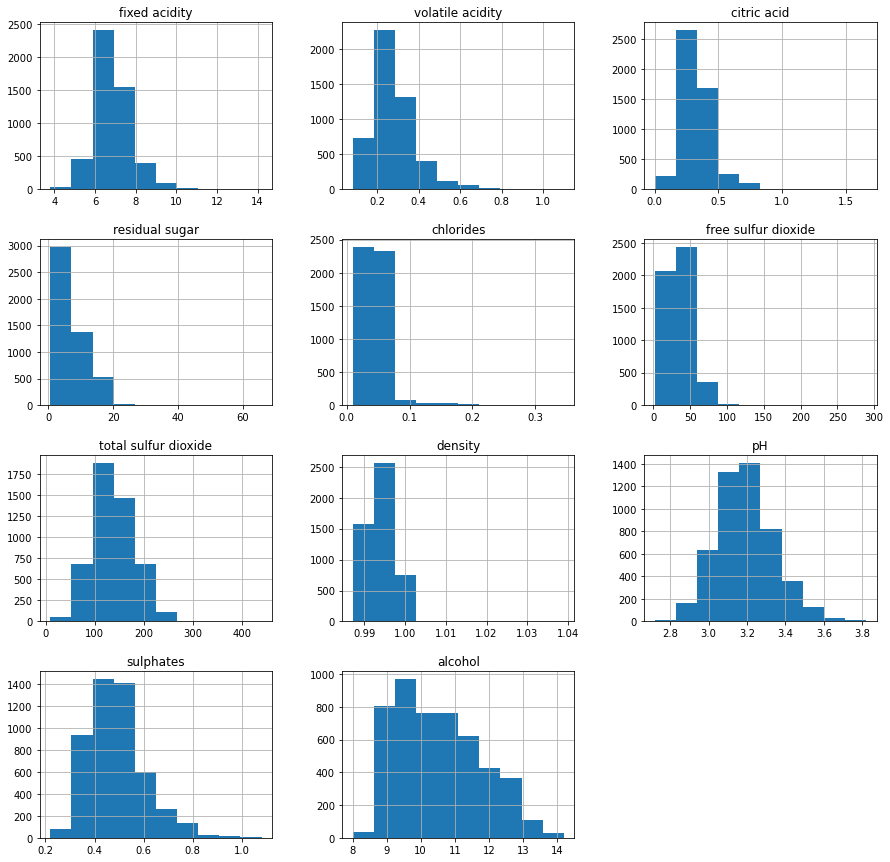

In [4]:
data.hist(figsize=(15, 15));

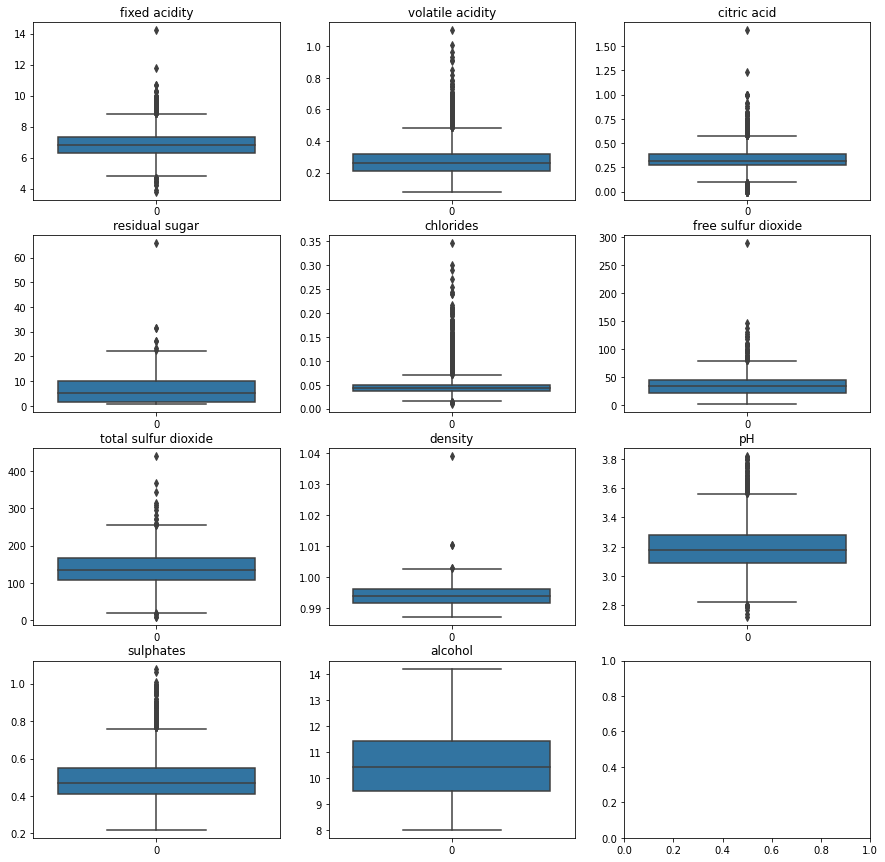

In [5]:
col_nums = 3  # how many plots per row
row_nums = math.ceil(len(data.columns) / col_nums)  # how many rows of plots
# print(col_nums, row_nums)
_, axes = plt.subplots(nrows=row_nums, ncols=col_nums, figsize=(15,15))
for i, ax in enumerate(axes.flatten()):
    sns.boxplot(data = data.iloc[:,i], ax = ax).set_title(data.columns[i]);
    if i+1 == len(data.columns) : break
plt.show();

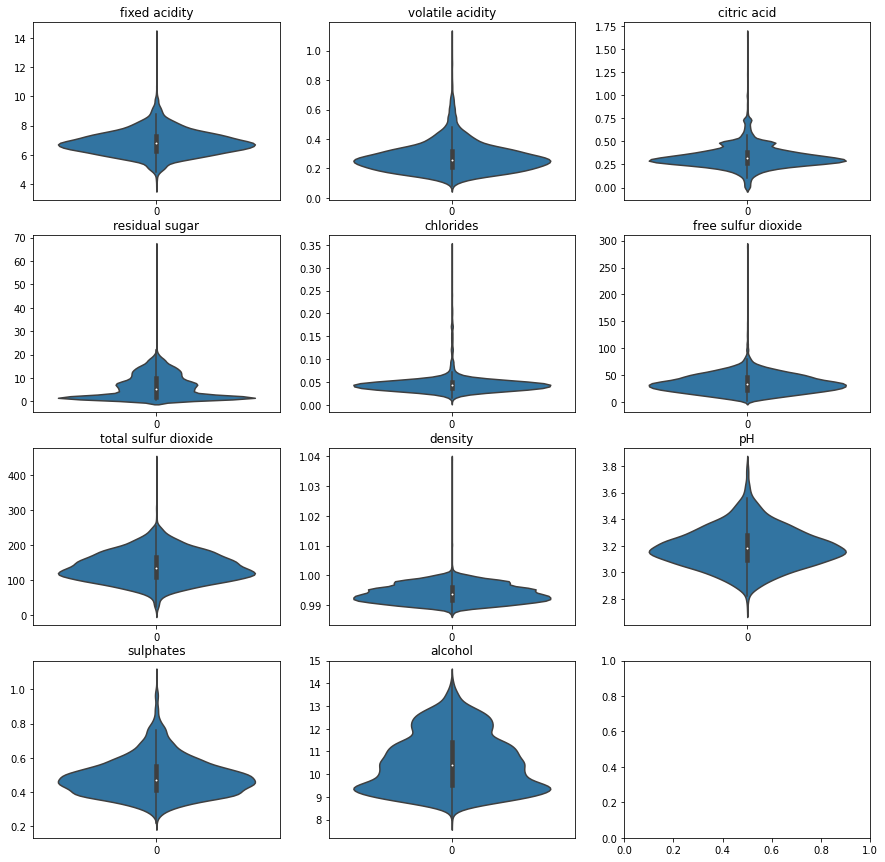

In [6]:
col_nums = 3  # how many plots per row
row_nums = math.ceil(len(data.columns) / col_nums)  # how many rows of plots
# print(col_nums, row_nums)
fig, axes = plt.subplots(nrows=row_nums, ncols=col_nums, figsize=(15,15))
for i, ax in enumerate(axes.flatten()):
    sns.violinplot(data = data.iloc[:,i], ax = ax).set_title(data.columns[i])
    if i + 1 == len(data.columns) : break

Обратите внимание, что в данном случае, для анализа корреляционной матрицы удачно использовать **симетричные** цветовые схемы

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
fixed acidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
volatile acidity,-0.022697,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
citric acid,0.289181,-0.149472,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
residual sugar,0.089021,0.064286,0.094212,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
chlorides,0.023086,0.070512,0.114364,0.088685,NaN,NaN,NaN,NaN,NaN,NaN,NaN
free sulfur dioxide,-0.049396,-0.097012,0.094077,0.299098,0.101392,NaN,NaN,NaN,NaN,NaN,NaN
total sulfur dioxide,0.091070,0.089261,0.121131,0.401439,0.198910,0.615501,NaN,NaN,NaN,NaN,NaN
density,0.265331,0.027114,0.149503,0.838966,0.257211,0.294210,0.529881,NaN,NaN,NaN,NaN
pH,-0.425858,-0.031915,-0.163748,-0.194133,-0.090439,-0.000618,0.002321,-0.093591,NaN,NaN,NaN
sulphates,-0.017143,-0.035728,0.062331,-0.026664,0.016763,0.059217,0.134562,0.074493,0.155951,NaN,NaN


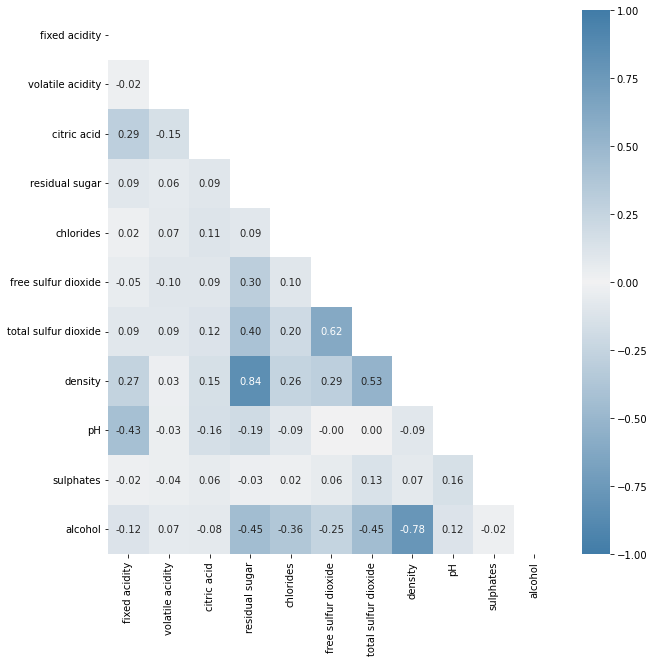

In [7]:
plt.figure(figsize=(10,10))

corr_matrix = data.corr()
mask = np.tril(corr_matrix, k = -1).astype(bool)
display(corr_matrix.where(mask))

mymap = sns.diverging_palette(240, 240, as_cmap = True)

# я не использую mask как опцию в heatmap т.к. она перевернет данные :(
sns.heatmap(corr_matrix.where(mask), vmin = -1, vmax = 1,
            annot=True, fmt='.2f', center=0, cmap=mymap);

In [8]:
### ВНИМАНИЕ !!!! ВАЖНО ПОМНИТЬ матрица симетрична !!! Нужно искать максимумв имин на ТРЕУГОЛЬНОЙ МАТРИЦЕ !!!

mask_high_corr = corr_matrix.where(mask).apply(lambda x: abs(x)>0.6).any()
columns_high_corr = mask_high_corr[mask_high_corr].index
columns_high_corr

Index(['residual sugar', 'free sulfur dioxide', 'density'], dtype='object')

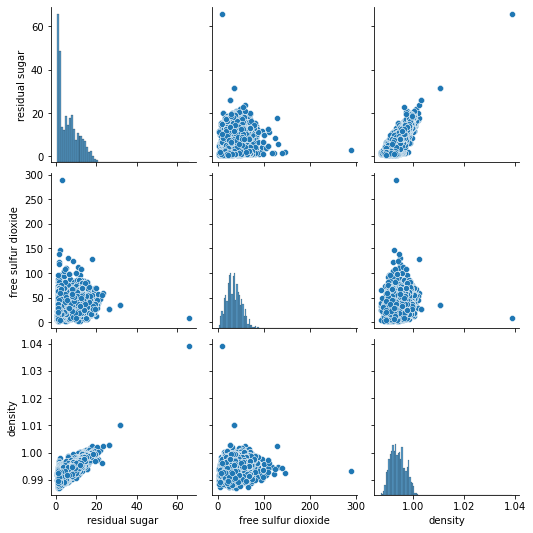

In [9]:
sns.pairplot(data[columns_high_corr]);

In [10]:
data_features = data.drop(columns = columns_high_corr)
data_features

,fixed acidity,volatile acidity,citric acid,chlorides,total sulfur dioxide,pH,sulphates,alcohol
0,7.0,0.27,0.36,0.045,170.0,3.00,0.45,8.8
1,6.3,0.30,0.34,0.049,132.0,3.30,0.49,9.5
2,8.1,0.28,0.40,0.050,97.0,3.26,0.44,10.1
3,7.2,0.23,0.32,0.058,186.0,3.19,0.40,9.9
4,7.2,0.23,0.32,0.058,186.0,3.19,0.40,9.9
...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,0.039,92.0,3.27,0.50,11.2
4894,6.6,0.32,0.36,0.047,168.0,3.15,0.46,9.6
4895,6.5,0.24,0.19,0.041,111.0,2.99,0.46,9.4
4896,5.5,0.29,0.30,0.022,110.0,3.34,0.38,12.8


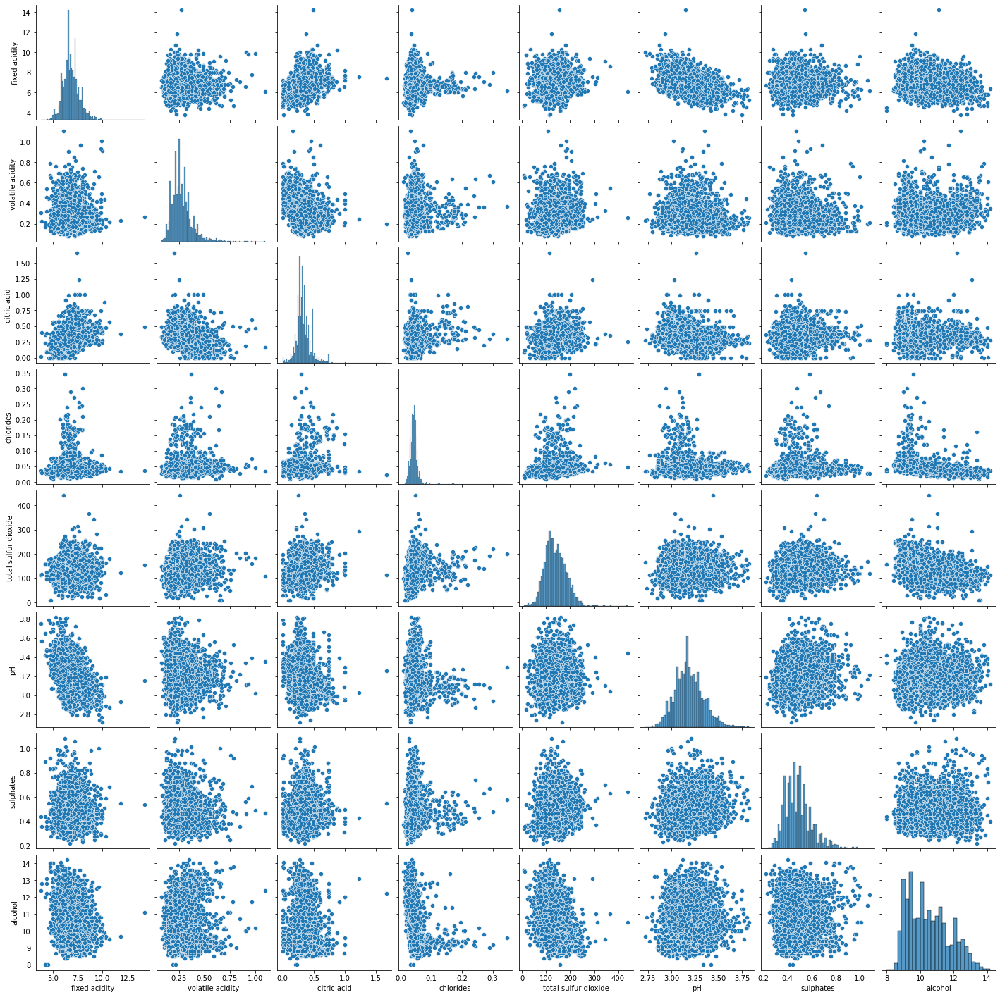

In [11]:
sns.pairplot(data_features);

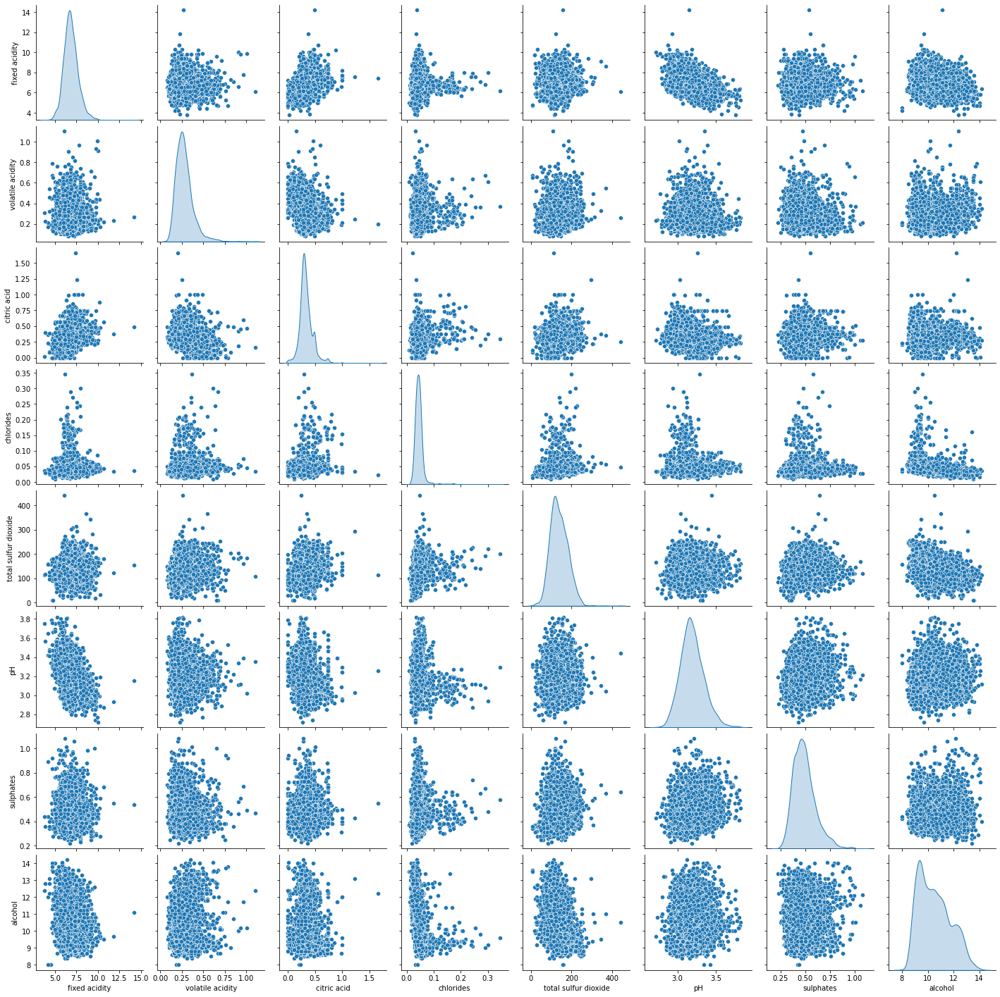

In [12]:
### считается дольше, но вид более корректный!!!
sns.pairplot(data_features, diag_kind="kde");

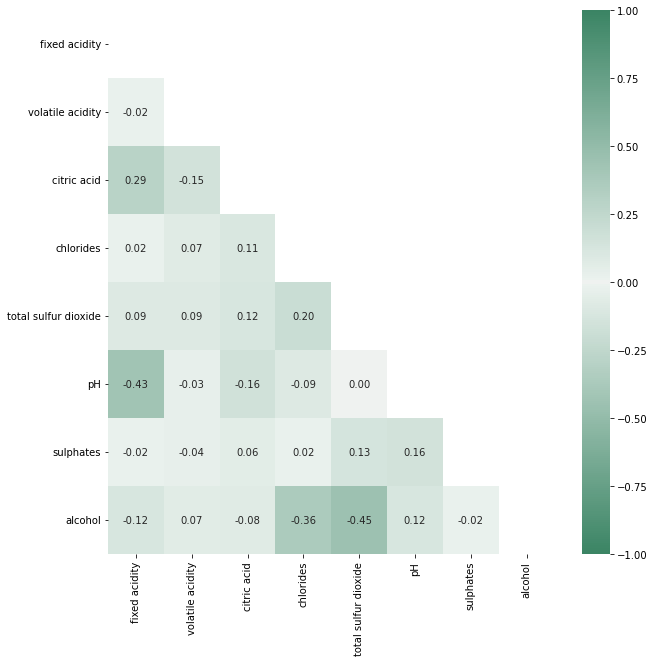

In [13]:
# проверим теперь корреляционную матрицу

plt.figure(figsize=(10,10))
corr_matrix = data_features.corr()
mask = np.tril(corr_matrix, k=-1).astype(bool)
mymap = sns.diverging_palette(150, 150, as_cmap = True)
sns.heatmap(corr_matrix.where(mask), vmin = -1, vmax = 1,
            annot=True, fmt='.2f', center=0, cmap=mymap);

# <center> Статистические методы </center>

## <center> 3-сигмы</center> 

In [14]:
def outlier_std(df, column, multiplier=3):
    mean = df[column].mean()
    std = df[column].std()
    lower_bound = mean - multiplier * std
    upper_bound = mean + multiplier * std
    outliers = ~df[column].between(lower_bound,upper_bound)
    return outliers, lower_bound, upper_bound


def anomalies_detection (df, columns=None, function=outlier_std, multiplier = 3):
    if columns:
        columns_check = columns
    else:
        columns_check = df.columns
    anomalies_columns_table = {}
    anomalies = pd.Series(False, index = df.index, name='anomalies')
    for column in columns_check:
        outliers, lower_bound, upper_bound = function(df, column, multiplier = multiplier)
        anomalies[outliers[outliers].index] = True
        ### True, False для расчета процентов вычисляем среднее :)
        anomalies_columns_table[column] = [upper_bound, lower_bound, sum(outliers), 100*np.mean(outliers)]
    anomalies_columns_table = pd.DataFrame(anomalies_columns_table).T
    anomalies_columns_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_pct']
    return anomalies_columns_table, anomalies

def anomalies_report(anomalies):
    return print("Аномалий: {}\nПроцент аномалий:   {:.2f}%".format(sum(anomalies), 100*np.mean(anomalies))) 

std_data = data_features.copy()
anomalies_columns_table, anomalies = anomalies_detection(std_data, multiplier = 3)    
std_data['is_anomalies'] = anomalies


display(anomalies_columns_table)
anomalies_report(anomalies)
display(std_data)

,upper_bound,lower_bound,anomalies_count,anomalies_pct
fixed acidity,9.386392,4.323183,46.0,0.939159
volatile acidity,0.580625,-0.024143,81.0,1.653736
citric acid,0.697251,-0.028868,85.0,1.735402
chlorides,0.111316,-0.019772,102.0,2.082483
total sulfur dioxide,265.854851,10.866464,12.0,0.244998
pH,3.641268,2.735265,32.0,0.653328
sulphates,0.832224,0.147469,48.0,0.979992
alcohol,14.206129,6.822405,0.0,0.000000


Аномалий: 365
Процент аномалий:   7.45%


,fixed acidity,volatile acidity,citric acid,chlorides,total sulfur dioxide,pH,sulphates,alcohol,is_anomalies
0,7.0,0.27,0.36,0.045,170.0,3.00,0.45,8.8,False
1,6.3,0.30,0.34,0.049,132.0,3.30,0.49,9.5,False
2,8.1,0.28,0.40,0.050,97.0,3.26,0.44,10.1,False
3,7.2,0.23,0.32,0.058,186.0,3.19,0.40,9.9,False
4,7.2,0.23,0.32,0.058,186.0,3.19,0.40,9.9,False
...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,0.039,92.0,3.27,0.50,11.2,False
4894,6.6,0.32,0.36,0.047,168.0,3.15,0.46,9.6,False
4895,6.5,0.24,0.19,0.041,111.0,2.99,0.46,9.4,False
4896,5.5,0.29,0.30,0.022,110.0,3.34,0.38,12.8,False


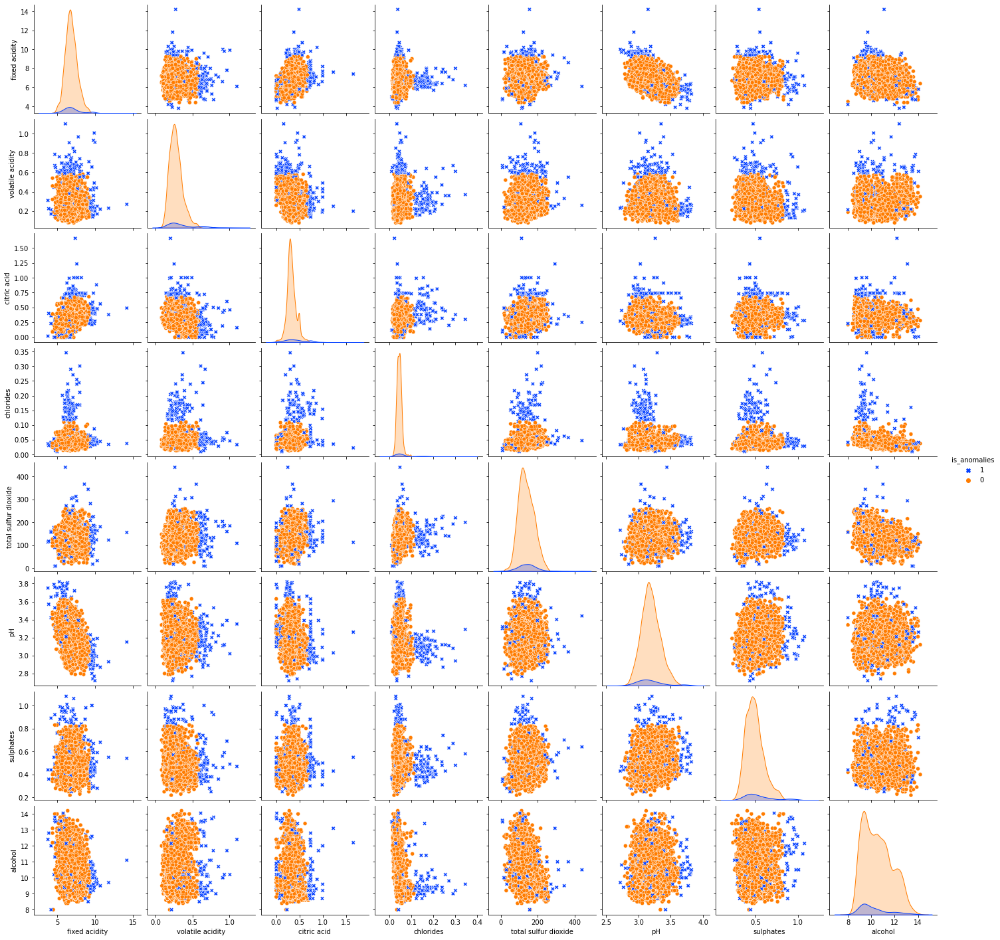

In [15]:
sns.pairplot(data = std_data, 
             hue='is_anomalies', hue_order=[1, 0], 
             markers=['o','X'],  palette='bright');

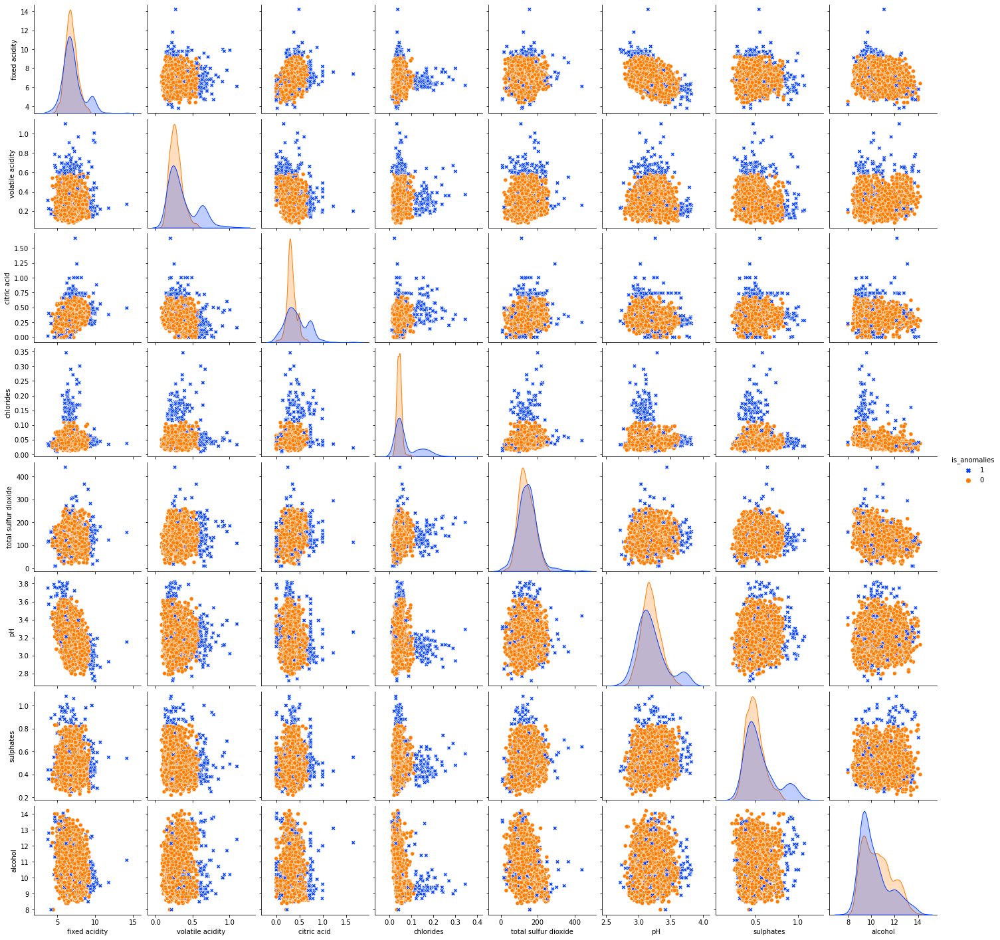

In [16]:
sns.pairplot(data = std_data, 
             hue='is_anomalies', hue_order=[1, 0], 
             diag_kind="kde",
             diag_kws=dict(common_norm=False), # этот параметр отменяет общую нормировку площади =1
             markers=['o','X'],  palette='bright');

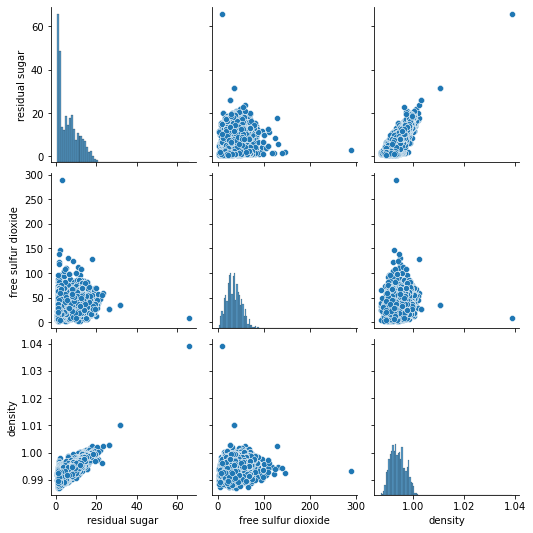

In [17]:
sns.pairplot(data[columns_high_corr]);
df = data[columns_high_corr].copy()

In [18]:
anomalies_columns_table, anomalies = anomalies_detection(df, multiplier = 3)    
df['is_anomalies'] = anomalies

display(anomalies_columns_table)
anomalies_report(anomalies)
display(df)

,upper_bound,lower_bound,anomalies_count,anomalies_pct
residual sugar,21.607588,-8.824758,9.0,0.183748
free sulfur dioxide,86.329497,-15.713327,32.0,0.653328
density,1.003000,0.985055,3.0,0.061249


Аномалий: 41
Процент аномалий:   0.84%


,residual sugar,free sulfur dioxide,density,is_anomalies
0,20.7,45.0,1.00100,False
1,1.6,14.0,0.99400,False
2,6.9,30.0,0.99510,False
3,8.5,47.0,0.99560,False
4,8.5,47.0,0.99560,False
...,...,...,...,...
4893,1.6,24.0,0.99114,False
4894,8.0,57.0,0.99490,False
4895,1.2,30.0,0.99254,False
4896,1.1,20.0,0.98869,False


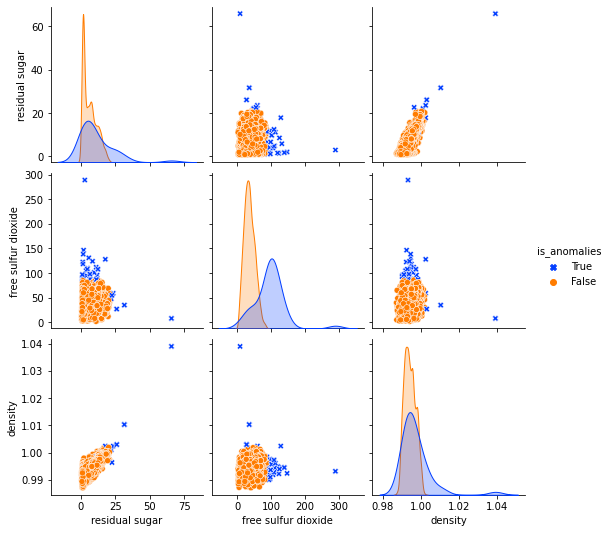

In [19]:
sns.pairplot(df,
             hue='is_anomalies', hue_order=[True, False], 
             diag_kind="kde",
             diag_kws=dict(common_norm=False),
             markers=['o','X'],  palette='bright');

In [20]:
## Кто сможет сделать график на оси Полный для True и False,  
## и второй для True получит дополнительно 10 баллов!

## <center> Межквантильное отклонение</center> 

In [21]:
### необходимо построить собственную функцию основанную на межквантильном отклонении 1Q-IQR и 3Q+IQR, 
### гдe IQR = 3Q-1Q, Q - квантиль
### обязательно использовать функцию anomalies_detection!










# <center> Метод на основе измерений расстояний</center>

## <center> Метод расчета расстояния от центра кластера </center> 

In [22]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler, StandardScaler

class AnomaliesDistance(BaseEstimator):
    """
    Модель обнаружения индексов на основе вычисления расстояния от центроида кластера
    
    Метод Fit вычисляет центроид обучающей выборки и используя метод metric в scipy.spatial.distance.cdist, 
    находит расстояния от центроида до точек обучающей выбороки.
    Метод позволяет вычислить "порог" на основе заданного "перцентиля" для расстояний.
    
    Метод Predict использует вычесленный "порог", чтобы определить является ли новая точка выбросом.
    
    -----------
    Параметры:
    - metric: string, default - 'euclidean'
        используется для задания метода расчета рассояния (scipy.spatial.distance.cdist)
        
    - percentile: float in range [0, 100], default - 90
        параметр устанавливающий порог принятия решения об аномальности значения
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(bool)
        return predictions

Для расчетов расстояний НЕОБХОДИМО, что бы значения были сопоставивы по осям. Лучше всего использлвать RobustScaler, иначе выбросы повлияют на средее.

In [23]:
scaler = RobustScaler()
scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features), 
    columns=data_features.columns)

In [24]:
euclidian_model = AnomaliesDistance(metric='euclidean', percentile=90)
euclidian_model.fit(scaled_data)
euclidian_anomalies = euclidian_model.predict(scaled_data)
euclidian_anomalies
anomalies_report(euclidian_anomalies)

Аномалий: 489
Процент аномалий:   9.98%


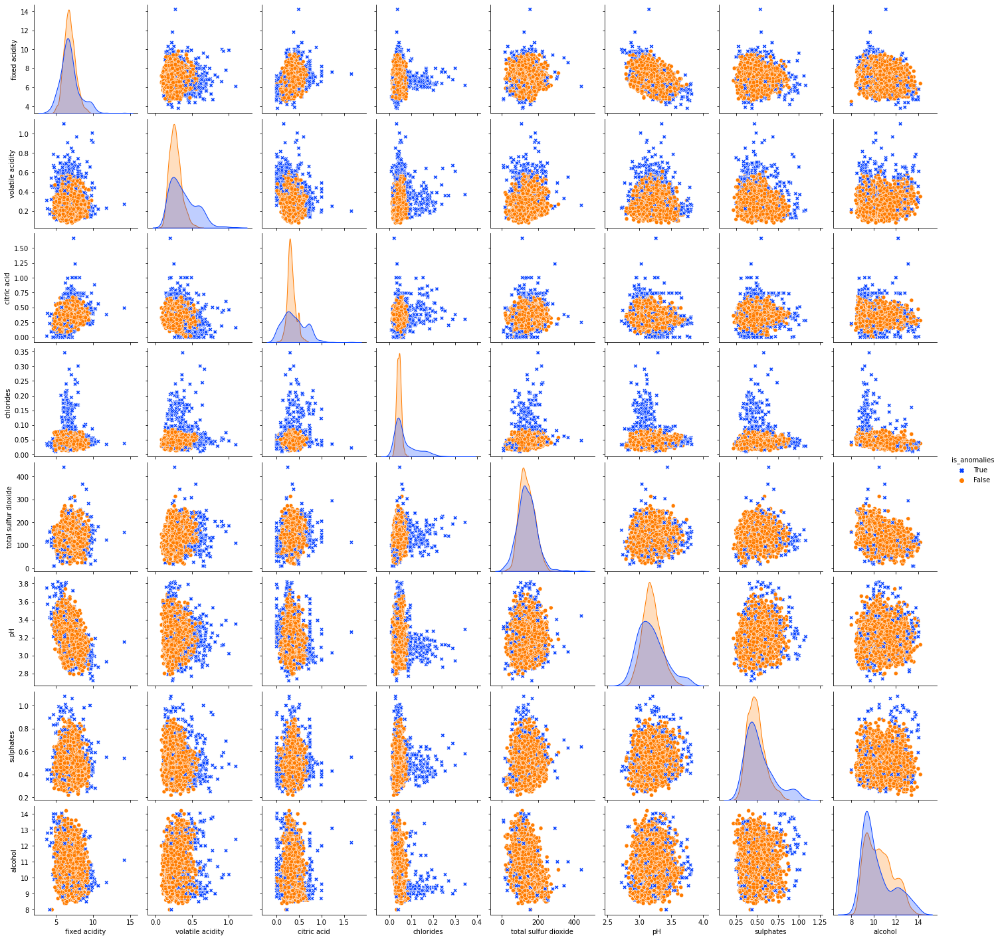

In [25]:
cluster_data = data_features.copy()
cluster_data['is_anomalies'] = euclidian_anomalies

sns.pairplot(data=cluster_data, 
             hue='is_anomalies', hue_order=[True, False], 
             diag_kind="kde",
             diag_kws=dict(common_norm=False), 
             markers=['o','X'],  palette='bright');

Отобразим n-мерное пространство на двухмерную плоскость,  а затем попробуем отразить наши аномалии на проекции 

/Users/imachome/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/imachome/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


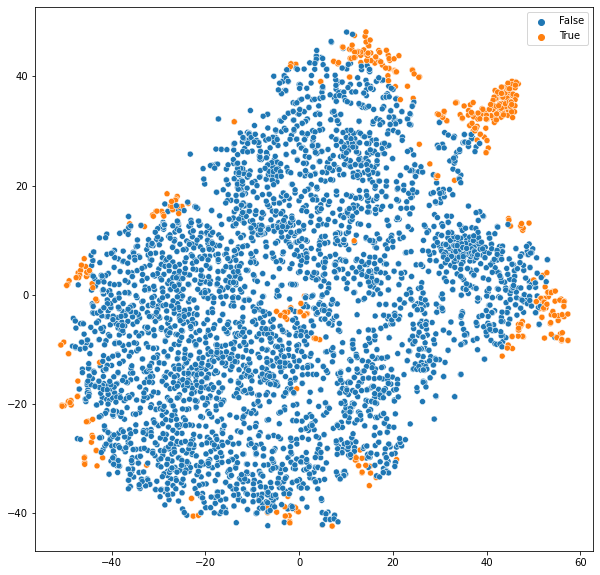

In [26]:
from sklearn.manifold import TSNE

tsne = TSNE(perplexity = 99, n_jobs = -1) # менял perplexity для получения большей 'красоты'
tsne_transformed = tsne.fit_transform(scaled_data)

plt.figure(figsize=(10, 10))
sns.scatterplot(x = tsne_transformed[:, 0], y = tsne_transformed[:, 1], hue = euclidian_anomalies);

# <center> Метод основанный на плотности данных - DBSCAN </center>

## <center> Метод на основе DBSCAN </center>

<img src="https://upload.wikimedia.org/wikipedia/commons/a/af/DBSCAN-Illustration.svg" width=500>

**Визуализация**   https://www.naftaliharris.com/blog/visualizing-dbscan-clustering/

**Алгоритм:**
1. Выбираем случайную точку и находим её соседей в заданной окрестности (<code>eps</code> - радиус, <code>min_samplesint</code> - "количество точек" внутри радиуса, наше пороговое значение)
2. Если соседей меньше порогового значения – считаем точку шумом
3. Если соседей больше или равно пороговому значению  – объединяем в «плотный» кластер и повторяем поиск соседей
4. Если все плотные точки пройдены и помечены как посещенные – выбираем новую не посещенную точку и начинаем сначала
5. Повторяем, пока все точки не будут посещены


**Преимущества:**
- Density-based (плотностной/вероятностный) метод – умеет находить сложные формы кластеров
- Поиск выбросов и аномалий в данных за счет точек шума

**Недостатки:**
- Очень чувствителен к параметру <code>eps</code>

**Идея поиска аномалий:** аномалии должны сильно отличаться от основных данных и скорее всего попадут в "шум". Поэтому будем увеличивать параметр  <code>eps</code> до тех пор, пока все "плотные" данные не окажутся в кластерах, а "шума" будет столько, сколько мы предпологам получит аномалий в данных. 

In [27]:
from sklearn.cluster import DBSCAN

# для очень маленький эпсилон и начинаем увеличивать
eps = 0.05
anomalies_percentage = 1.

eps_history = []
num_clusters = []
anomaly_percentage = []

# берем маленький эпсилон и начинаем увеличивать
eps = 0.05
eps_history = [eps]
while anomalies_percentage > 0.1:    
    model = DBSCAN(eps=eps).fit(scaled_data)
    num_clusters.append(np.unique(model.labels_).size-1)
    anomalies = np.where(model.labels_< 0, True, False)

    anomalies_percentage = np.mean(anomalies)    
    eps_history.append(eps)
    anomaly_percentage.append(anomalies_percentage)
    eps += 0.05 # внимание важно где разместить! Почему?
    
model = DBSCAN(eps_history[-1]) # Почему eps_history, а не eps?
model.fit(scaled_data)
anomalies = np.where(model.labels_< 0, True, False)
anomalies_report(anomalies)

Аномалий: 463
Процент аномалий:   9.45%


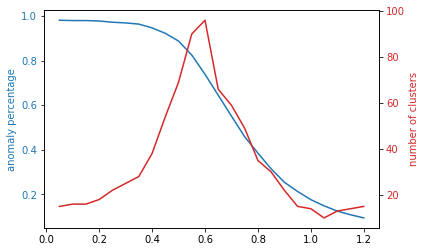

In [28]:
iterations = eps_history[:-1]

fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_ylabel('anomaly percentage', color=color) 
ax1.plot(iterations, anomaly_percentage, color=color)
ax1.tick_params(axis='y', labelcolor=color)


ax2 = ax1.twinx()  
color = 'tab:red'
ax2.set_xlabel('epsilon')
ax2.set_ylabel('number of clusters', color=color)
ax2.plot(iterations, num_clusters, color=color)
ax2.tick_params(axis='y', labelcolor=color)

#fig.tight_layout()  
plt.show()

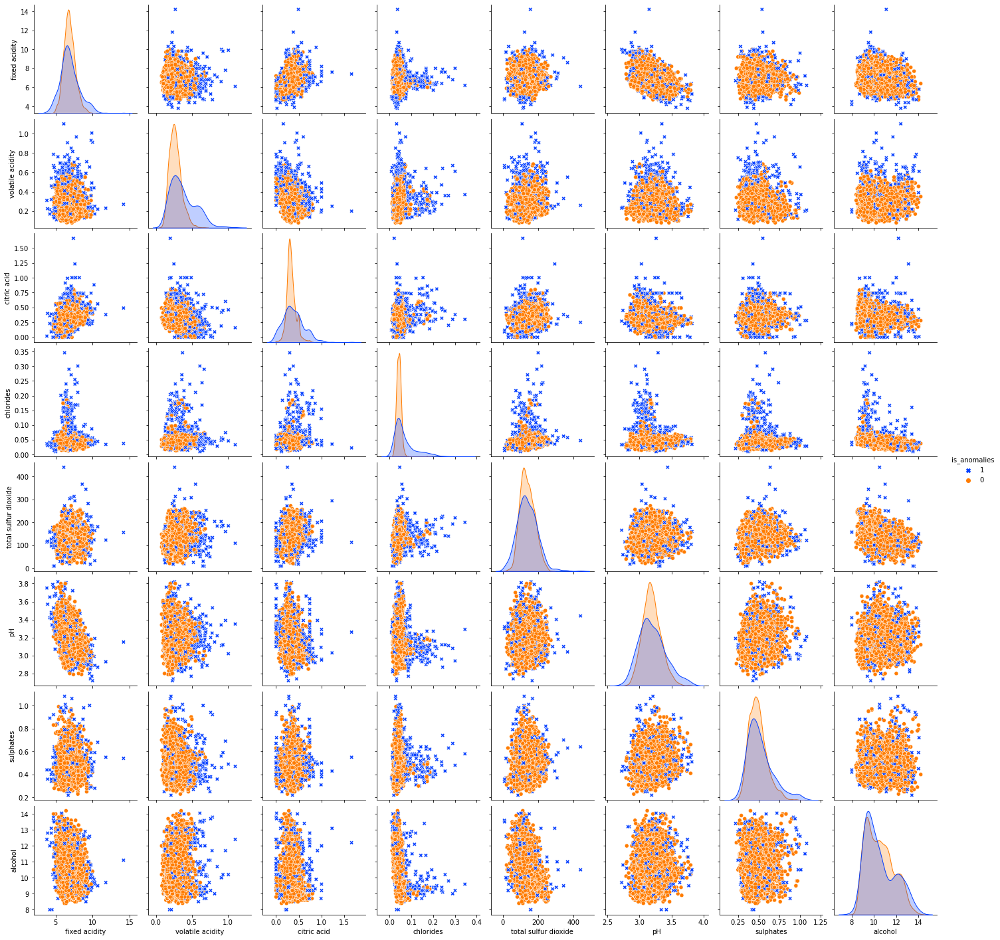

In [29]:
dbscan_data = data_features.copy()
dbscan_data['is_anomalies'] = anomalies

sns.pairplot(data=dbscan_data, 
             hue='is_anomalies', hue_order=[1, 0], 
             diag_kind="kde",
             diag_kws=dict(common_norm=False), 
             markers=['o','X'],  palette='bright');

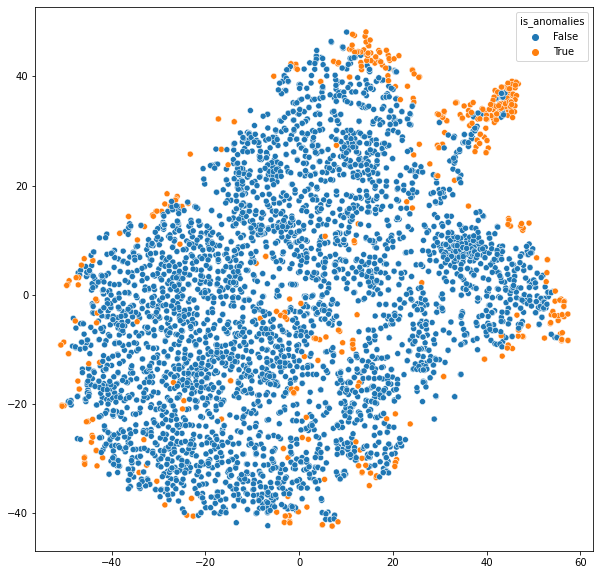

In [30]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x = tsne_transformed[:, 0], y = tsne_transformed[:, 1], hue = dbscan_data['is_anomalies']);

# <center>Методы основанные на моделях машинного обучения</center>

## <center>One-Class SVM</center>

![](https://sandipanweb.files.wordpress.com/2018/04/svm_slack.png?w=676)

**Основная идея алгоритма SVM (в случае с классификацией)** - разделить классы гиперплоскостью так, чтобы максимизировать расстояние между ними. Для нелинейного разделения данных используется так называемый Kernel Trick. Это функция, которая способна преобразовать пространство признаков (в том числе нелинейно), без непосредственного преобразования признаков. Крайне эффективна в плане вычисления и потенциально позволяет получать бесконечноразмерные признаковые пространства. 

Смысл преобразований в том,  что классы, линейно неразделимые в текущем признаковом пространстве, могут стать разделимыми в пространствах более высокой размерности:
![](https://miro.medium.com/max/1838/1*eU9PzjVcLNbNEzBC2g_iWg.jpeg)




[One Class SVM](http://rvlasveld.github.io/blog/2013/07/12/introduction-to-one-class-support-vector-machines/) - это одна из форм классического алгоритма SVM, модификация которого заключается в следующей идее:<br> 
преобразовать признаковое пространство и провести разделяющую гиперплоскость так, чтобы наблюдения лежали как можно дальше от начала координат. <br>
В результате получим границу, по одну сторону которой лежат максимально "плотные" и похожие друг на друга наблюдения из нашей выборки, а по другую будут находится аномальные значения, не похожие на все остальные.<br>
Процент таких аномальных наблюдений, которые модель будет пытаться отделить от основной части выборки, мы снова задаём в самом начале обучения при помощи параметра <code>nu</code>:
![](https://www.researchgate.net/profile/Hany_Alashwal/publication/242572058/figure/fig1/AS:393295319584771@1470780319210/Classification-in-one-class-SVM.png)

Аномалий: 499
Процент аномалий:   10.19%


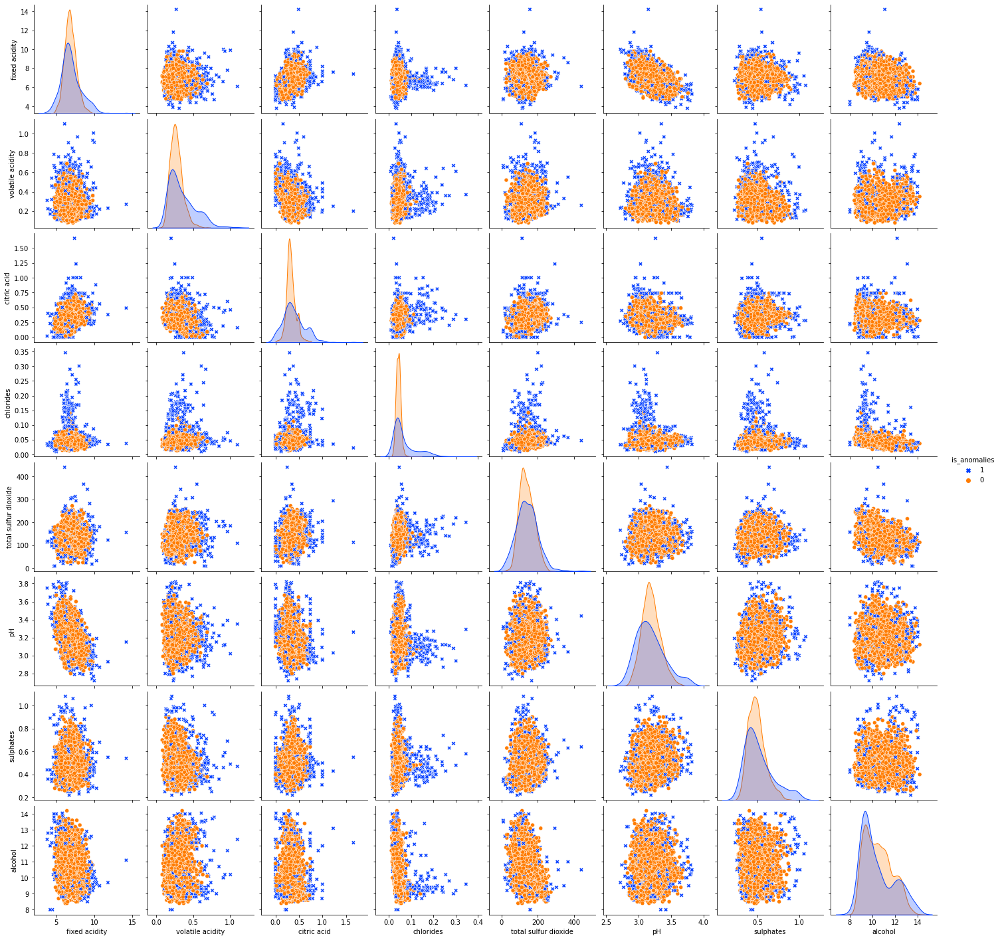

In [54]:
from sklearn.svm import OneClassSVM

one_class_svm = OneClassSVM(nu=0.1, gamma='auto')
one_class_svm.fit(scaled_data)
svm_outliers = one_class_svm.predict(scaled_data)
anomalies = np.where(svm_outliers < 0, True, False)
anomalies_report(anomalies)

svm_data = data_features.copy()
svm_data['is_anomalies'] = np.where(anomalies, True, False)

sns.pairplot(data = svm_data, 
             hue ='is_anomalies', hue_order=[1, 0], 
             diag_kind="kde",
             diag_kws=dict(common_norm=False), 
             markers=['o','X'],  palette='bright');

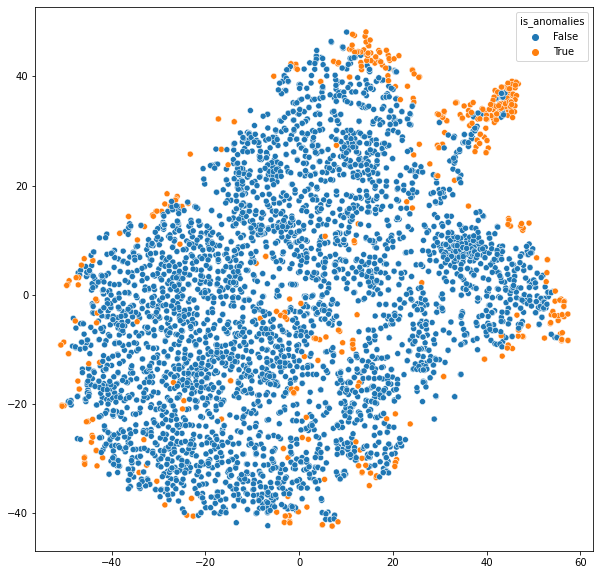

In [32]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x = tsne_transformed[:, 0], y = tsne_transformed[:, 1], hue = svm_data['is_anomalies']);

**Преимущества:**
- благодаря kernel trick, модель способна проводить **нелинейные разделяющие границы**;
- особенно удобно использовать, когда в данных недостаточно "плохих" наблюдений, чтобы использовать стандартный подход обучения с учителем - бинарную классификацию.

**Недостатки:**
- может очень сильно **переобучиться** и выдавать большое количество ложно отрицательных результатов, если разделяющий зазор слишком мал;
- сложность точной настройки.

## <center> Isolation Forest </center>

**Основная идея алгоритма Isolation Forest** заключатся в  вычислении шагов "изолирования" каждой точки данных.  Если точка изолируются "слишком легко", то скорее всего она лежит достаточно далего от остальных точек и является выбросом. Если "слишком тяжело" - скорее всего она лежит среди остальных точек и выбросом не является. 

<img src="https://quantdare.com/wp-content/uploads/2018/03/outlier2.gif" width=600>

<img src="https://quantdare.com/wp-content/uploads/2018/03/inlier2.gif" width=600>

С математической точки зрения разбиение всех точек данных может быть представлено древовидной структурой, в то время как количество шагов, необходимых для изоляции точки, можно интерпретировать как длину пути внутри дерева данного дерева, начиная от корня к вершине. 

Например, длина подобного пути на нижней схеме больше, чем длина пути на верхней схеме. 

Подробнее  [тут ...](https://quantdare.com/isolation-forest-algorithm/)

In [48]:
from sklearn.ensemble import IsolationForest

isolation_forest = IsolationForest(n_estimators=100, 
                                   contamination=0.1, 
                                   #max_features=1, 
                                   #bootstrap=True
                                  )
isolation_forest.fit(scaled_data.values)

isolation_predict = isolation_forest.predict(scaled_data.values)
anomalies = np.where(isolation_predict < 0, True, False)
anomalies_report(anomalies)


Аномалий: 490
Процент аномалий:   10.00%


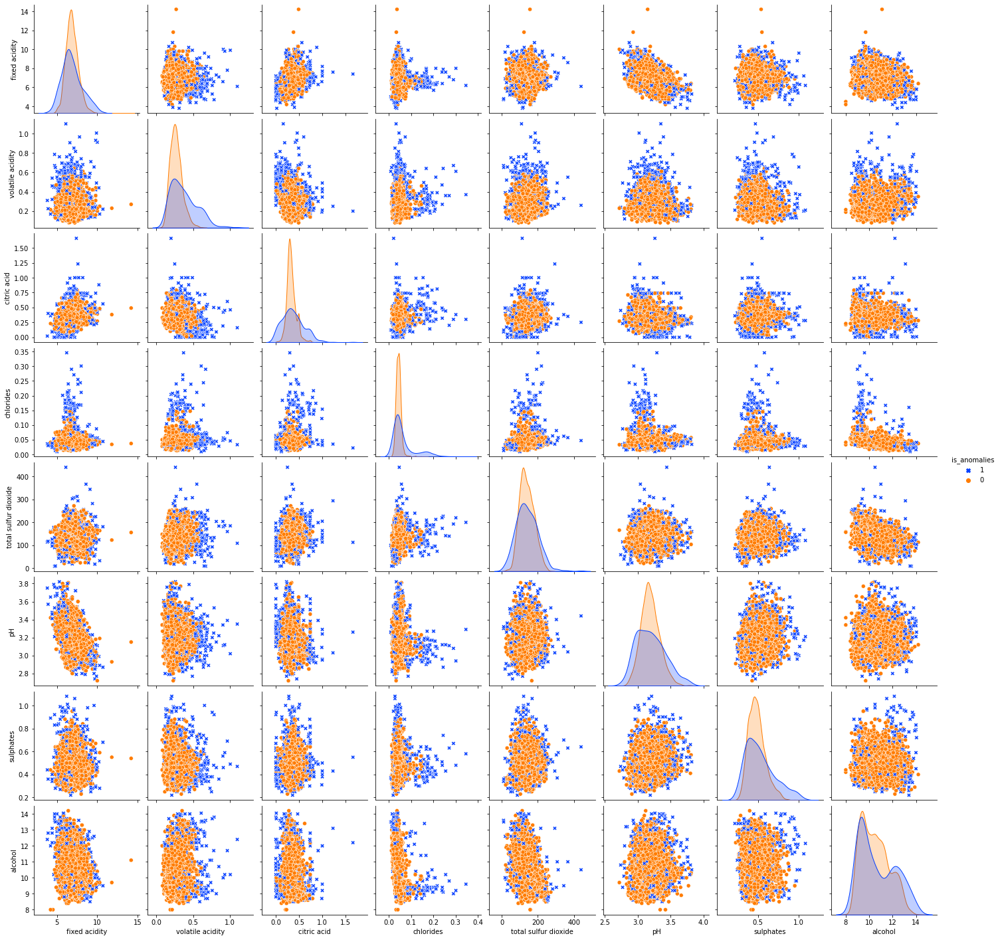

In [34]:
isolation_data = data_features.copy()
isolation_data['is_anomalies'] = anomalies

sns.pairplot(data=isolation_data,
             hue ='is_anomalies', hue_order=[1, 0], 
             diag_kind="kde",
             diag_kws=dict(common_norm=False), 
             markers=['o','X'],  palette='bright');

**Преимущества:**
- данные не нужно приводить к сопостовимым разменростям, как и любые леса;
- быстрый и легко параллелится.

**Недостатки:**
- прямоугольность (поясним ниже);
- группы аномальных точек могут объеденится в кластер и "маскироваться" под данные;
- как для любого леса, может быть сложно подобрать параметры не имея хотя бы минимальной разметки или предположения о количестве аномалий.

## <center> Extended Isolation Forest </center>

**Основная идея алгоритма Extented Isolation Forest** заключатся в  вычислении шагов "изолирования" каждой точки данных, но в отличии от обычного леса для разбиения используются прямые не перпендикулярные осям ординат.  Если точка изолируются "слишком легко", то скорее всего она лежит достаточно далего от остальных точек и является выбросом. Если "слишком тяжело" - скорее всего она лежит среди остальных точек и выбросом не является. 

Зачем так сложно городить "огород"?

Исходные данные:
<img src="https://raw.githubusercontent.com/sahandha/eif/master/figures/Training.png" width=600>

Isolation Forest (посмотрите на прямоугольность результатов):
<img src="https://raw.githubusercontent.com/sahandha/eif/master/figures/scores_maps.png" width=600>

Extented Isolation Forest:
<img src="https://raw.githubusercontent.com/sahandha/eif/master/figures/scores_maps_extended.png" width=600>

Как это работает?<br>
Разбиение осуществляется прямыми (или плоскостями) не являющихся нормальными к ортам.
<img src="https://miro.medium.com/max/1400/1*wNhsc5_u5704BSd_06z7ig.png" width=600>

В результате нет видимых артефактов на ппересечениях.

**Самостоятельно,** сделайте "зашумленный синус" и сравните работу двух лесов. В чем принципиальная разница?

In [35]:

#pip install eif


Аномалий: 490
Процент аномалий:   10.00%


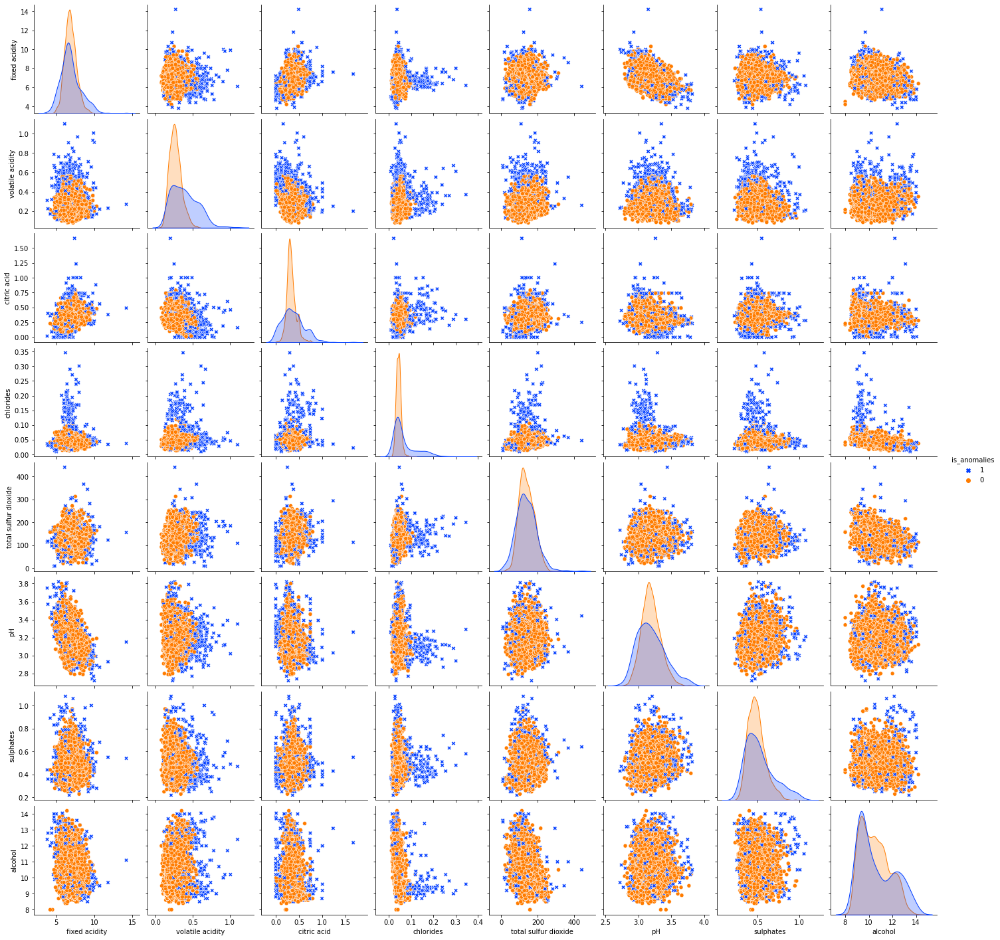

In [36]:
import eif

eif_forest = eif.iForest(scaled_data.values, ntrees=200, sample_size=256, ExtensionLevel=1)
eif_score = eif_forest.compute_paths(X_in=scaled_data.values) 
bound = np.percentile(eif_score, 90)
anomalies = np.where(eif_score > bound, True, False)

anomalies_report(anomalies)

eif_data = data_features.copy()
eif_data['is_anomalies'] = anomalies

sns.pairplot(data = eif_data,
             hue ='is_anomalies', hue_order=[1, 0], 
             diag_kind="kde",
             diag_kws=dict(common_norm=False), 
             markers=['o','X'],  palette='bright');

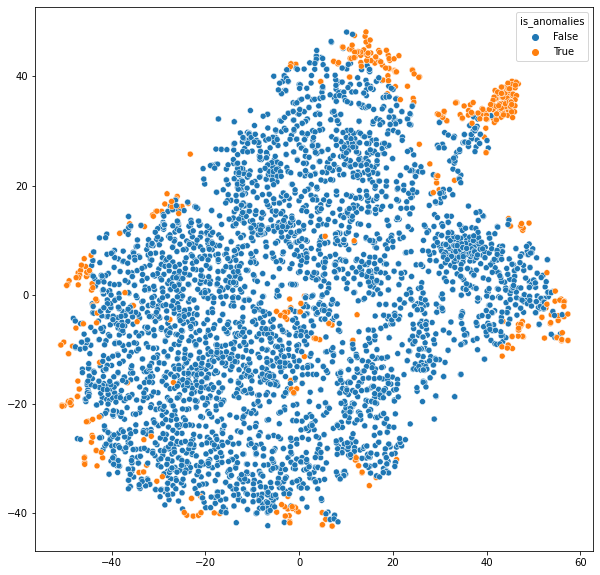

In [37]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x = tsne_transformed[:, 0], y = tsne_transformed[:, 1], hue = eif_data['is_anomalies']);

# Финальное сравнение

## Сравнение лесов

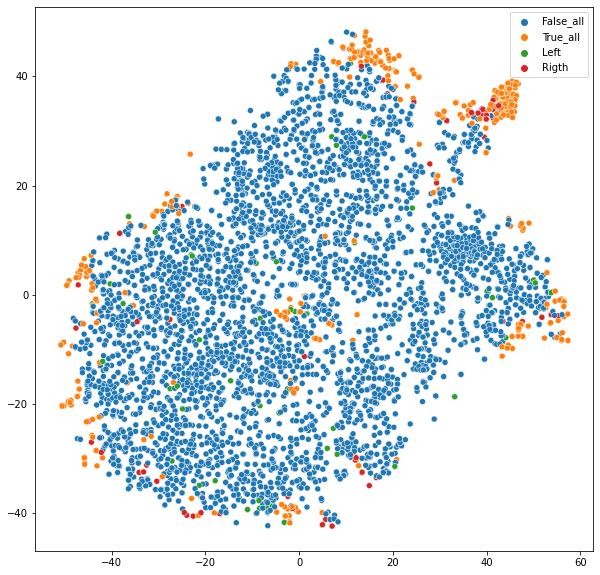

In [38]:
def combinat(x):
    x = list(x)
    if x == [True, True]:
       return 'True_all'
    elif x == [False, False]:
       return 'False_all'
    elif x == [True, False]:
       return 'Left'
    elif x == [False, True]:
       return 'Rigth'


left = isolation_data['is_anomalies']
right = eif_data['is_anomalies']

anomalies = pd.concat([left,right],axis = 1).apply(lambda x: combinat(x.values), axis =1)
plt.figure(figsize=(10, 10))
sns.scatterplot(x = tsne_transformed[:, 0], y = tsne_transformed[:, 1], hue = anomalies);

## Общее лесов

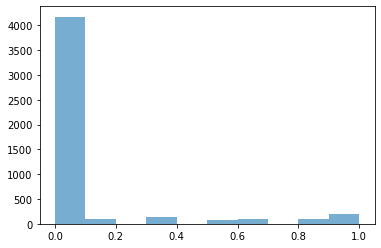

In [39]:
summary  = pd.concat([std_data['is_anomalies'],
                     cluster_data['is_anomalies'],
                     dbscan_data['is_anomalies'],
                     svm_data['is_anomalies'],
                     isolation_data['is_anomalies'], 
                     eif_data['is_anomalies']],axis = 1)
summary.columns = ['std', 'cluster','dbscan', 'svm', 'iso', 'eif']
summary['sum'] =  summary.mean(axis=1)


plt.hist(summary['sum'], alpha=0.6);

In [40]:
summary_result = data_features.copy()
summary_result['is_anomalies'] = np.where(summary['sum']>=0.8,True,False)
summary_result

,fixed acidity,volatile acidity,citric acid,chlorides,total sulfur dioxide,pH,sulphates,alcohol,is_anomalies
0,7.0,0.27,0.36,0.045,170.0,3.00,0.45,8.8,False
1,6.3,0.30,0.34,0.049,132.0,3.30,0.49,9.5,False
2,8.1,0.28,0.40,0.050,97.0,3.26,0.44,10.1,False
3,7.2,0.23,0.32,0.058,186.0,3.19,0.40,9.9,False
4,7.2,0.23,0.32,0.058,186.0,3.19,0.40,9.9,False
...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,0.039,92.0,3.27,0.50,11.2,False
4894,6.6,0.32,0.36,0.047,168.0,3.15,0.46,9.6,False
4895,6.5,0.24,0.19,0.041,111.0,2.99,0.46,9.4,False
4896,5.5,0.29,0.30,0.022,110.0,3.34,0.38,12.8,False


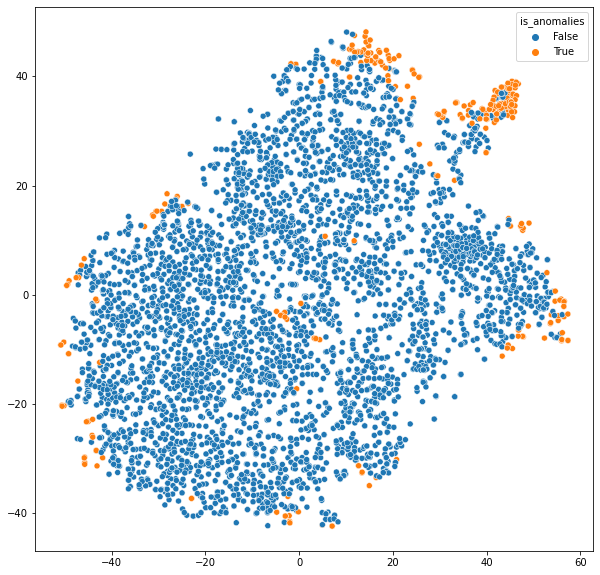

In [41]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x = tsne_transformed[:, 0], y = tsne_transformed[:, 1], hue = summary_result['is_anomalies']);

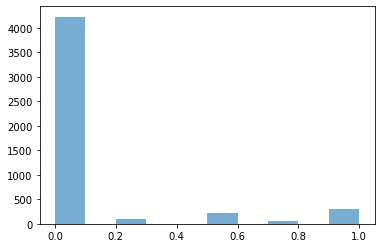

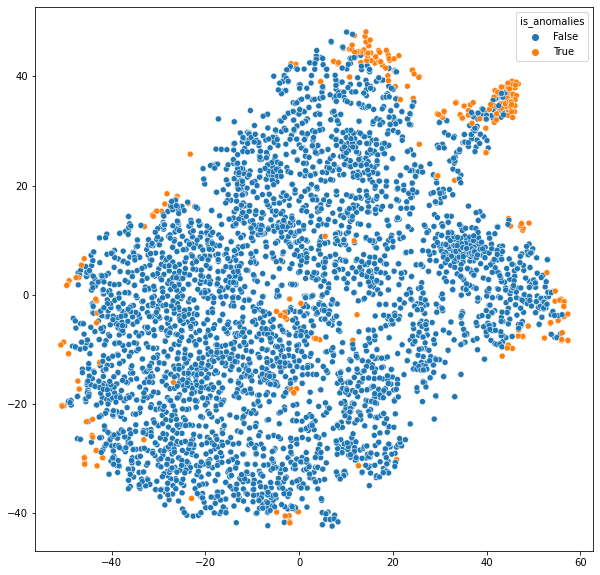

In [42]:
summary['sum'] =  summary[['dbscan', 'svm', 'iso', 'eif']].mean(axis=1)
plt.hist(summary['sum'], alpha=0.6);
summary_result['is_anomalies'] = np.where(summary['sum']>=0.9,True,False);
plt.figure(figsize=(10, 10))
sns.scatterplot(x = tsne_transformed[:, 0], y = tsne_transformed[:, 1], hue = summary_result['is_anomalies']);

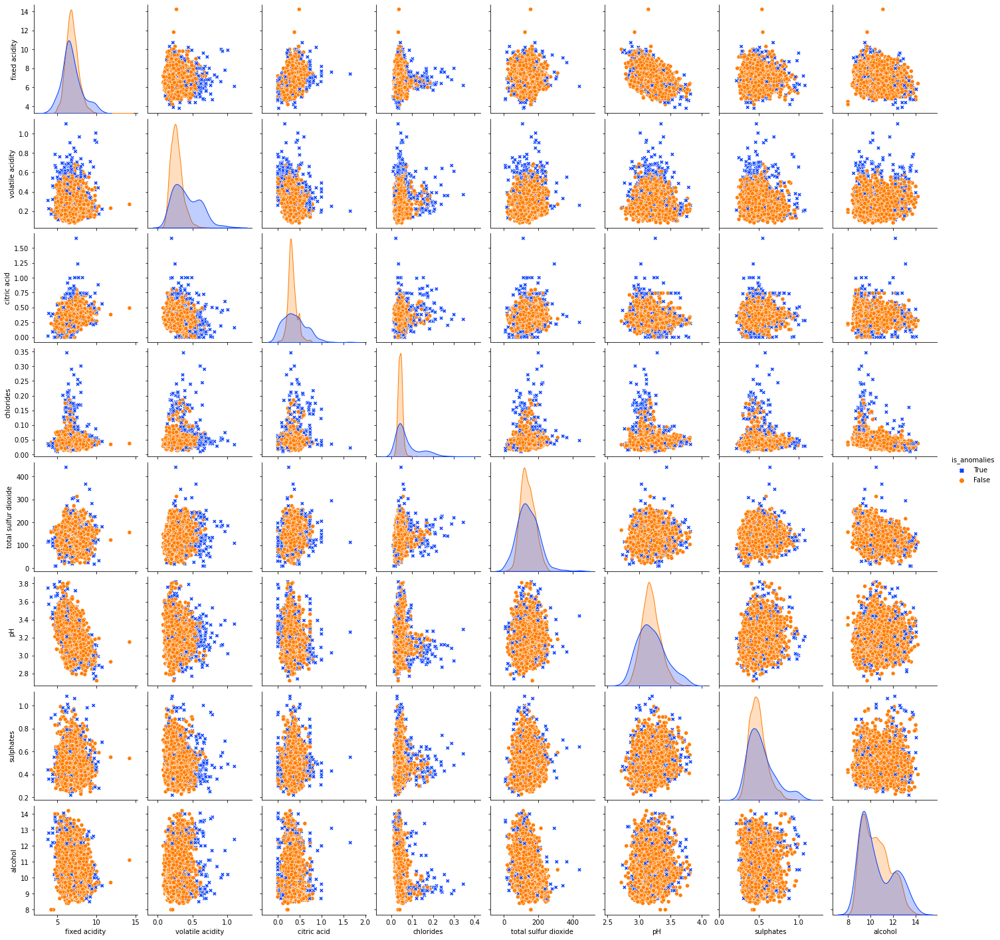

In [43]:
sns.pairplot(data = summary_result,
             hue ='is_anomalies', hue_order=[True, False], 
             diag_kind="kde",
             diag_kws=dict(common_norm=False), 
             markers=['o','X'],  palette='bright');

**Что еще почитать / посмотреть:**
- Плотностные методы для поиска аномалий https://towardsdatascience.com/density-based-algorithm-for-outlier-detection-8f278d2f7983
- Библиотека по поиску аномалий https://www.analyticsvidhya.com/blog/2019/02/outlier-detection-python-pyod/